In [13]:
%%time
import tensorflow as tf
import numpy as np
import time

from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img
from tensorflow.keras.applications import vgg19
from tensorflow.keras import backend as K
from scipy.optimize import fmin_l_bfgs_b
import matplotlib.pyplot as plt
%matplotlib inline

tf.compat.v1.get_default_graph()
tf.compat.v1.disable_eager_execution()

CPU times: user 2.15 ms, sys: 163 µs, total: 2.31 ms
Wall time: 18.1 ms


In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [15]:
# 변환하려는 이미지 경로
target_image_path = '/content/drive/MyDrive/pop/style_transfer/images/test1.png'
# 스타일 이미지 경로
style_reference_image_path = '/content/drive/MyDrive/pop/style_transfer/images/test2.png'

# 생성된 사진의 차원
width, height = load_img(target_image_path).size
img_height = 400
img_width = int(width * img_height / height) # 비율에 맞춰서 줄여준다.

In [17]:
# Utility Function

def preprocess_image(image_path):
    img = load_img(image_path, target_size = (img_height, img_width))
    img = img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    img = vgg19.preprocess_input(img)
    return img

def deprocess_image(x):
    # ImageNet 평균 픽셀 값 (cf)vgg19.preprocess_input conversion
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    
    #'BGR -> RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [18]:

# 보여줄 이미지
target_show = load_img(target_image_path)
style_reference_show = load_img(style_reference_image_path)

target_image = K.constant(preprocess_image(target_image_path))
style_reference_image = K.constant(preprocess_image(style_reference_image_path))
combination_image = K.placeholder((1, img_height, img_width, 3)) # placeholder for generated image
    # 입력된 훈련 데이터를 미니 배치로 나누어 계산 그래프에 주입하기 위해 보통 플레이스홀더의 첫 번째 차원(배치 차원)을 비워 놓는다.
    # style transfer은 하나의 이미지만 사용하므로 combination_image placeholder의 배치 차원을 1로 고정

input_tensor = K.concatenate([target_image, style_reference_image, combination_image], axis = 0)
    # 타깃 , 스타일 참조, 생성된 이미지를 행으로 쌓아서(axis = 0) minibatch처럼 생성
    # input_tensor의 차원은 (3, 400, 300, 3)

model = vgg19.VGG19(input_tensor = input_tensor, weights = 'imagenet', include_top = False)
model.summary()
print('Loading Model Finish')

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(3, 400, 537, 3)]        0         
                                                                 
 block1_conv1 (Conv2D)       (3, 400, 537, 64)         1792      
                                                                 
 block1_conv2 (Conv2D)       (3, 400, 537, 64)         36928     
                                                                 
 block1_pool (MaxPooling2D)  (3, 200, 268, 64)         0         
                                                                 
 block2_conv1 (Conv2D)       (3, 200, 268, 128)        73856     
                                                                 
 block2_conv2 (Conv2D)       (3, 200, 268, 128)        147584    
                                                                 
 block2_pool (MaxPooling2D)  (3, 100, 134, 128)        0     

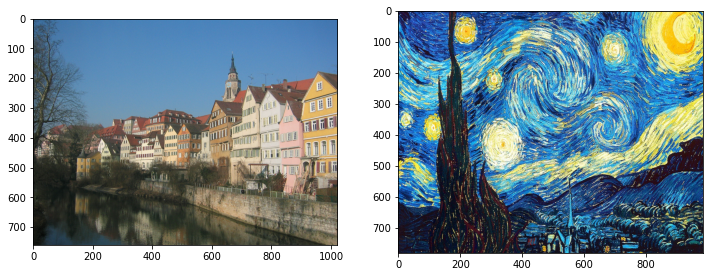

In [19]:
plt.figure(figsize=(12,12))
plt.subplot(1, 2, 1)
plt.imshow(target_show)
plt.subplot(1, 2, 2)
plt.imshow(style_reference_show)

In [20]:
# Definition of Loss

def content_loss(base, combination):
    return K.sum(K.square(combination - base))

def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    # batch_flatten : Turn a nD tensor into a 2D tensor with same 0th dimension.
    # permute_dimensions : Permutes axes in a tensor
    
    # 특성 맵의 차원을 배치 차원처럼 맨 앞으로 옯겨서 특성맵을 기준으로 벡터로 펼친다.
    gram = K.dot(features, K.transpose(features))
    return gram

def style_loss(style, combination):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = img_height * img_width
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

In [21]:
# Total Variation Loss

def total_variation_loss(x):
    a = K.square(x[:, :img_height - 1, :img_width - 1, :] - x[:, 1:,:img_width - 1, :])
    b = K.square(x[:, :img_height - 1, :img_width - 1, :] - x[:, img_height - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))
    # 두 손실에 하나를 더 추가한다. 생성된 이미지의 픽셀을 사용하여 계산하는 총 변위 손실이다.
    # 이는 생성된 이미지가 공간적인 연속성을 가지도록 도와주며 픽셀의 격자무늬가 과도하게 나타나는 것을 막아주는 일종의 규제 항이다.
    

In [22]:
# Definition of Final Loss to Minimize

outputs_dict = dict([(layer.name, layer.output) for layer in model.layers]) # 층 이름과 활성화 텐서 mapping

content_layer = 'block5_conv2' 
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1']

total_variation_weight = 1e-4    # 손실 항목의 가중치 평균에 사용할 가중치
style_weight = 1.
content_weight = 0.025

loss = K.variable(0.) # 모든 손실 요소를 더하여 하나의 스칼라 변수로 손실을 정의
layer_features = outputs_dict[content_layer]
target_image_features = layer_features[0, :, :, :]
combination_features = layer_features[2, :, :, :]
loss = loss + content_weight * content_loss(target_image_features, combination_features) # 콘텐츠 손실 합산

for layer_name in style_layers: # 스타일 손실 합산
    layer_features = outputs_dict[layer_name]
    style_reference_features = layer_features[1, :, :, :]
    combination_features = layer_features[2, :, :, :]
    sl = style_loss(style_reference_features, combination_features)
    loss = loss + (style_weight / len(style_layers)) * sl
    
loss = loss + total_variation_weight * total_variation_loss(combination_image) # 총 변위 손실 합산


In [23]:
# Gradient Descent (L-BFGS Algorithm - quasi-Newton Method)

# Scipy에 구현되어있는 L-BFGS 알고리즘은 두가지 제약사항을 가진다.
# Loss Function 값과 Gradient 값을 별개의 함수로 전달 / 3D 이미지 배열이 아니라 1차원 벡터만 처리가능
# 두 값을 동시에 계산하는 것은 비효율적이므로 동시에 계산하는 Evaluator 파이썬 클래스 생성(처음 호출시 손실 값 반환 & 다음 호출 위한 그래디언트 캐싱)

grads = K.gradients(loss, combination_image)[0] # 손실에 대한 생성된 이미지의 그래디언트

fetch_loss_and_grads = K.function([combination_image], [loss, grads]) # 현재 손실과 그래디언트 값 추출

class Evaluator(object):
    
    def __init__(self):
        self.loss_value = None
        self.grads_value = None
        
    def loss(self, x):
        assert self.loss_value is None
        x = x.reshape((1, img_height, img_width, 3))
        outs = fetch_loss_and_grads([x])
        loss_value = outs[0]
        grad_values = outs[1].flatten().astype('float64')
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value
        
    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values
    
evaluator = Evaluator()

반복 횟수 :  0
현재 손실 값 :  4578792000.0


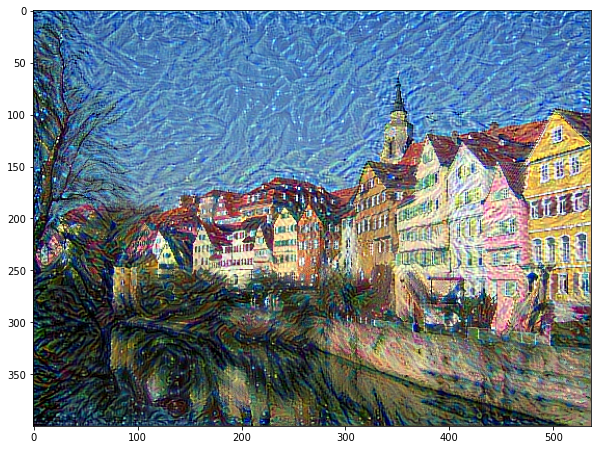

0 번째 반복 완료 : 11초
반복 횟수 :  1
현재 손실 값 :  1186072600.0


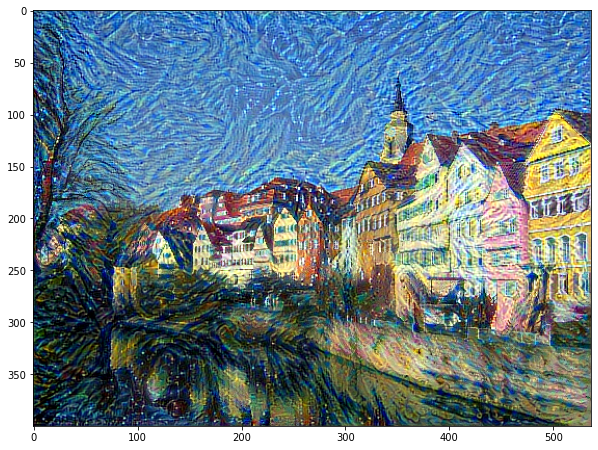

1 번째 반복 완료 : 11초
반복 횟수 :  2
현재 손실 값 :  630623500.0


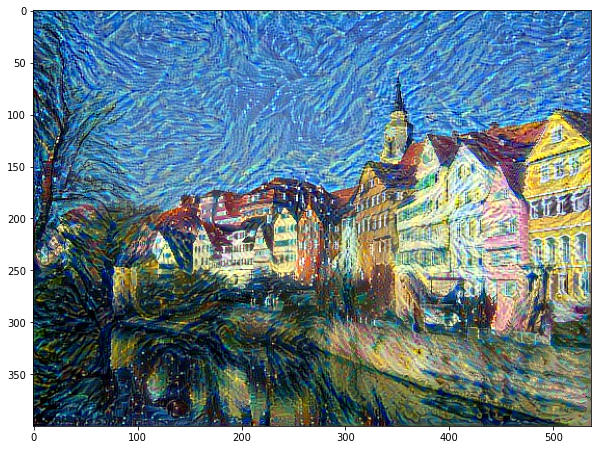

2 번째 반복 완료 : 11초
반복 횟수 :  3
현재 손실 값 :  432871070.0


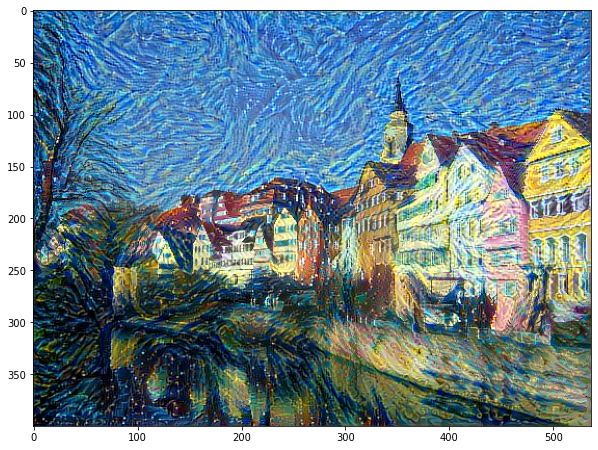

3 번째 반복 완료 : 7초
반복 횟수 :  4
현재 손실 값 :  345805900.0


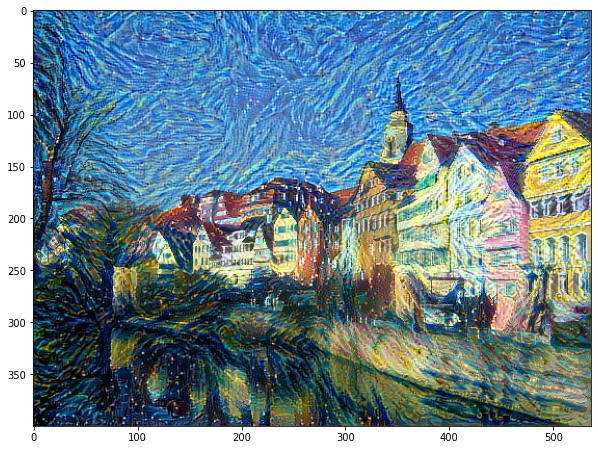

4 번째 반복 완료 : 9초
반복 횟수 :  5
현재 손실 값 :  295584930.0


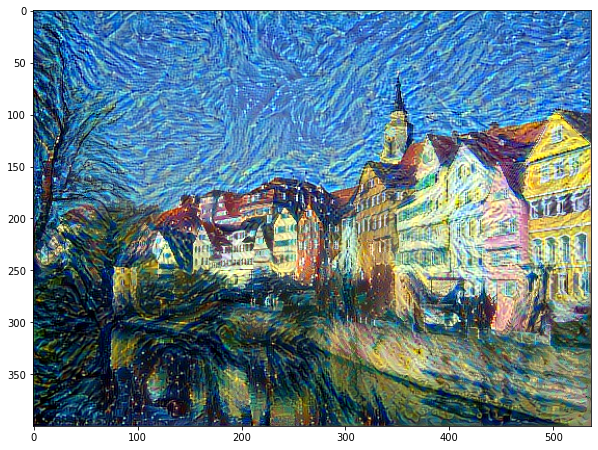

5 번째 반복 완료 : 9초
반복 횟수 :  6
현재 손실 값 :  240367620.0


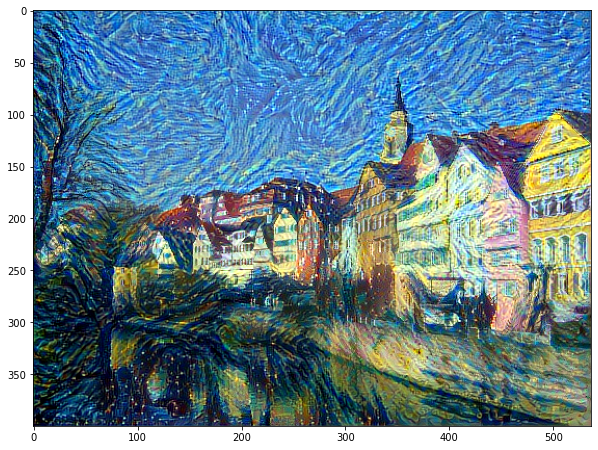

6 번째 반복 완료 : 8초
반복 횟수 :  7
현재 손실 값 :  204232240.0


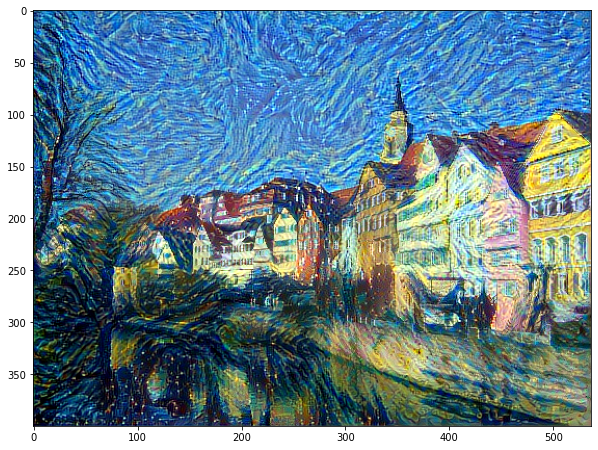

7 번째 반복 완료 : 8초
반복 횟수 :  8
현재 손실 값 :  175064020.0


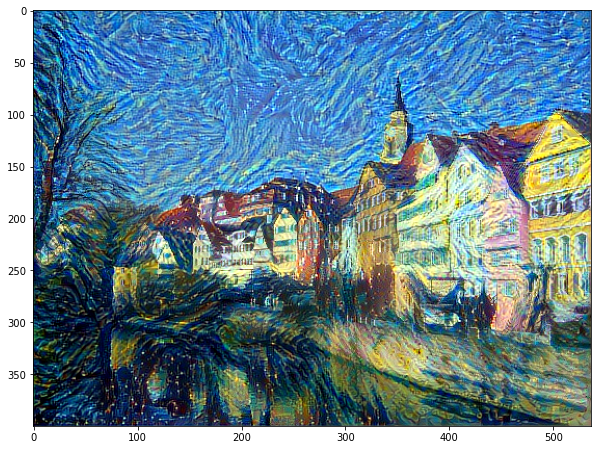

8 번째 반복 완료 : 7초
반복 횟수 :  9
현재 손실 값 :  160722780.0


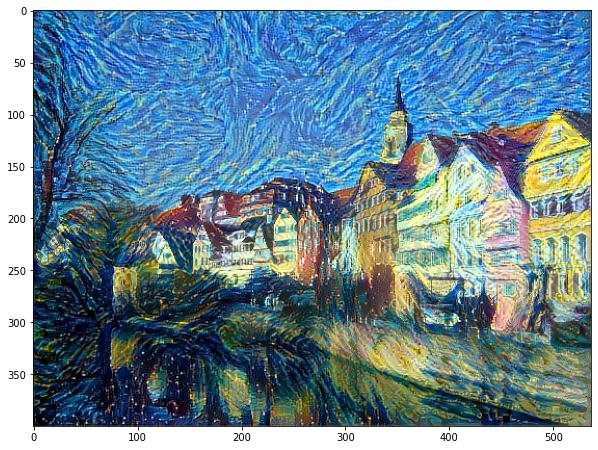

9 번째 반복 완료 : 8초
반복 횟수 :  10
현재 손실 값 :  152475060.0


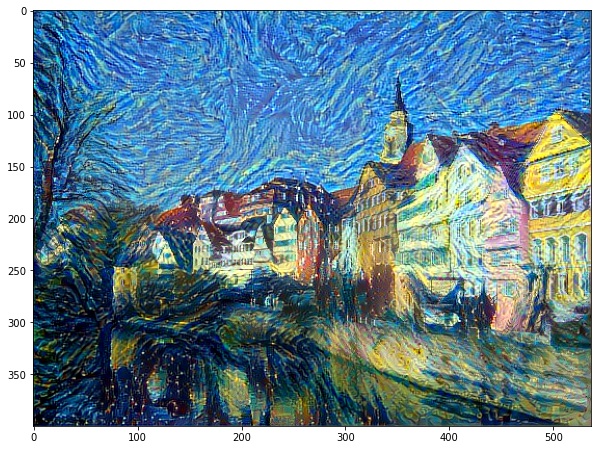

10 번째 반복 완료 : 8초
반복 횟수 :  11
현재 손실 값 :  145529490.0


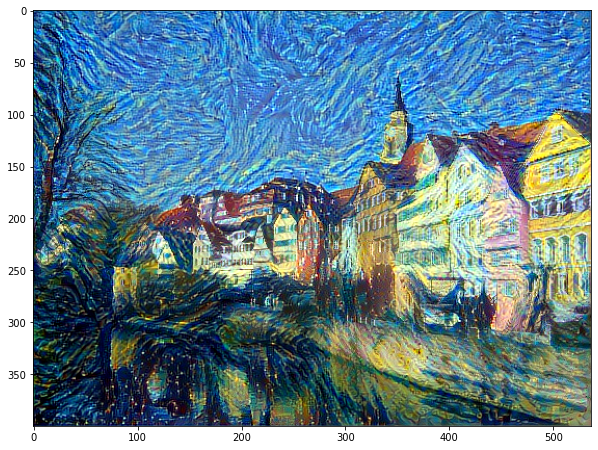

11 번째 반복 완료 : 8초
반복 횟수 :  12
현재 손실 값 :  139499730.0


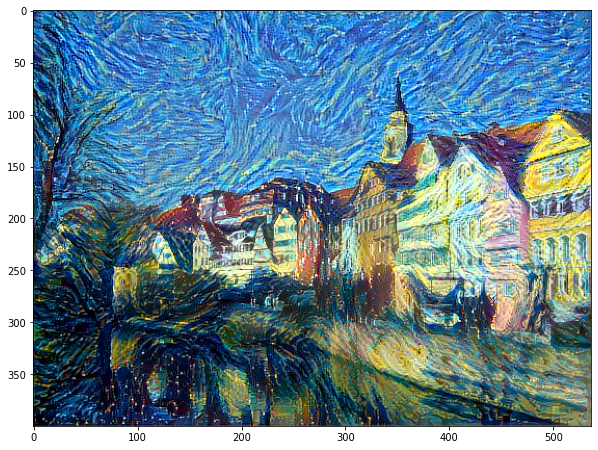

12 번째 반복 완료 : 7초
반복 횟수 :  13
현재 손실 값 :  133928210.0


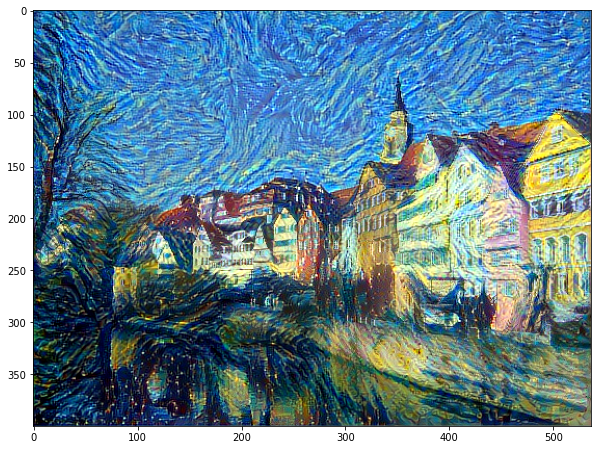

13 번째 반복 완료 : 8초
반복 횟수 :  14
현재 손실 값 :  129616020.0


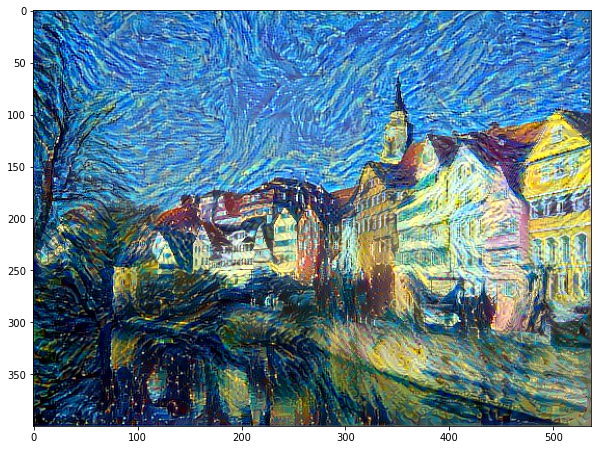

14 번째 반복 완료 : 8초
반복 횟수 :  15
현재 손실 값 :  125718950.0


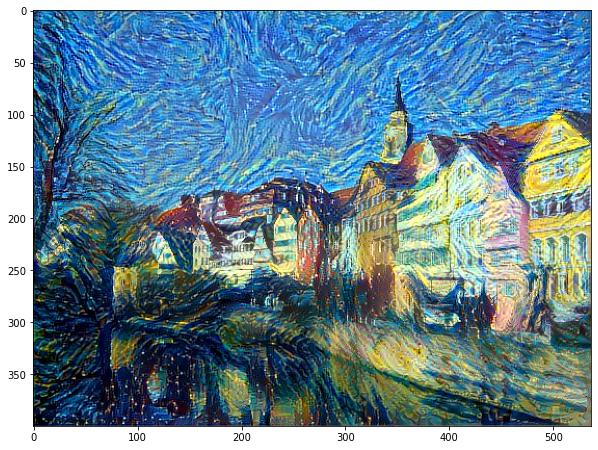

15 번째 반복 완료 : 8초
반복 횟수 :  16
현재 손실 값 :  121789310.0


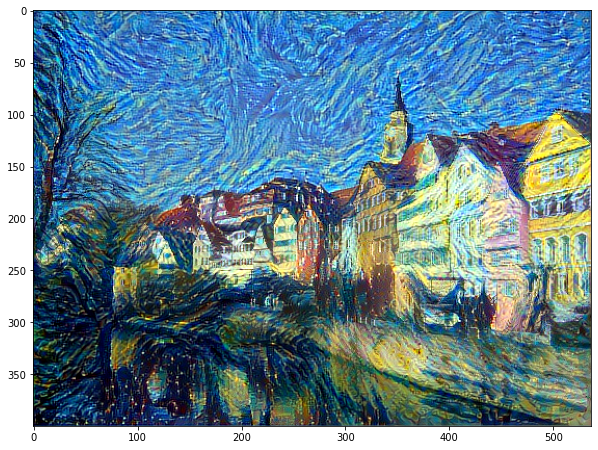

16 번째 반복 완료 : 8초
반복 횟수 :  17
현재 손실 값 :  118116536.0


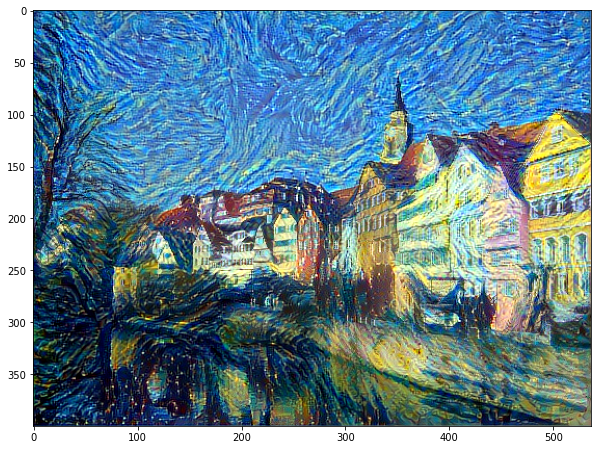

17 번째 반복 완료 : 7초
반복 횟수 :  18
현재 손실 값 :  114512320.0


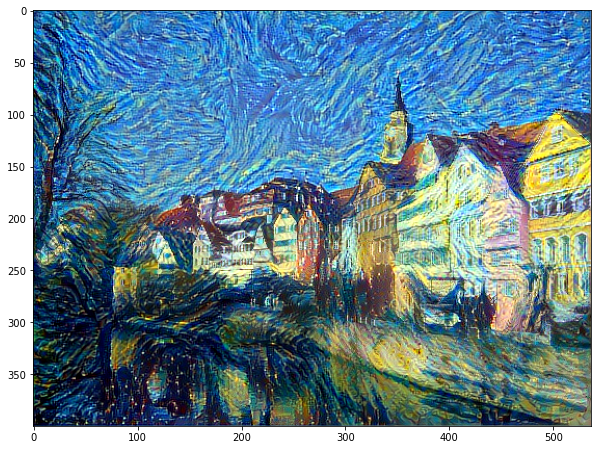

18 번째 반복 완료 : 8초
반복 횟수 :  19
현재 손실 값 :  110513080.0


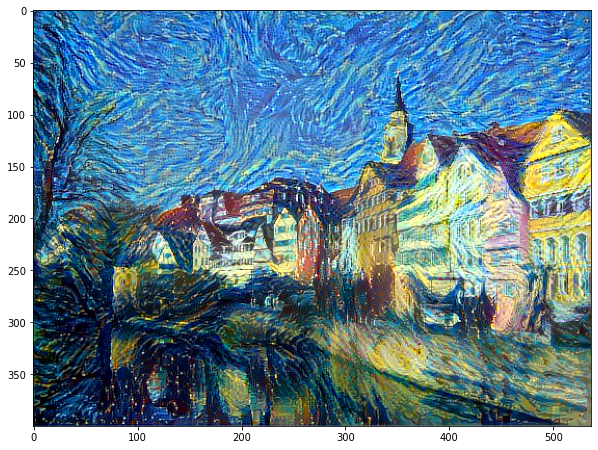

19 번째 반복 완료 : 8초
반복 횟수 :  20
현재 손실 값 :  107890296.0


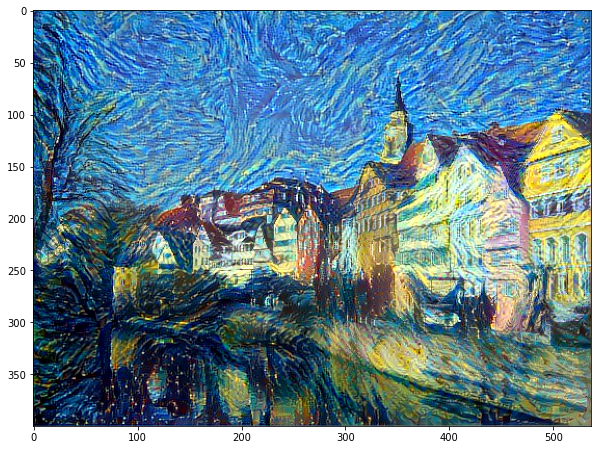

20 번째 반복 완료 : 8초


In [24]:
# Style Trasfer Iteration Loop

result_prefix = 'style_transfer_result'
iterations = 21

x = preprocess_image(target_image_path) # 초기값은 타깃 이미지
x = x.flatten() # scipy.optimize.fmin_l_bfgs_b 함수가 벡터만 처리할 수 있으므로 이미지를 벡터로 펼친다.
for i in range(iterations):
    print('반복 횟수 : ',i)
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x, fprime = evaluator.grads, maxfun = 20)
    print('현재 손실 값 : ',min_val)
    img = x.copy().reshape((img_height, img_width, 3))
    img = deprocess_image(img)
    fname = result_prefix + '_at_iteration_%d.png' % i
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    plt.show()

    end_time = time.time()
    print('%d 번째 반복 완료 : %d초' % (i, end_time - start_time))

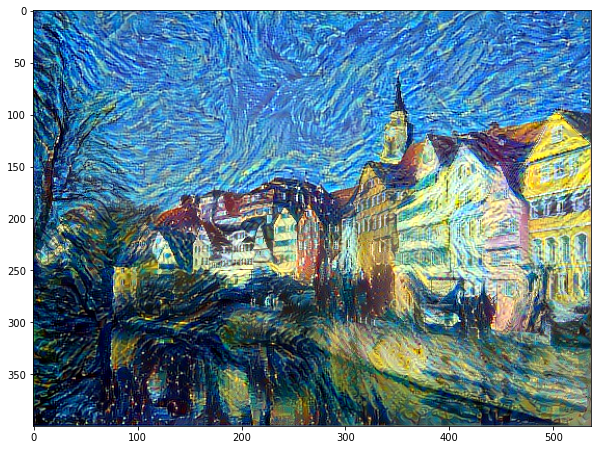

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(img)